# Image Processing and Augmantation for CNN using tensorflow

For this example I will use some images from [kaggle competition dataset](https://www.kaggle.com/c/petfinder-pawpularity-score/overview) "Pet Finder".

In [1]:
from matplotlib.image import imread, imsave
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import os
import tensorflow as tf
import tensorflow.keras.preprocessing.image as keras_image

from warnings import filterwarnings
filterwarnings('ignore')

from tensorflow.python.ops.numpy_ops import np_config
np_config.enable_numpy_behavior()

In [2]:
def get_filepaths(directory):
    """
    This function will generate the file names in a directory 
    tree by walking the tree either top-down or bottom-up. For each 
    directory in the tree rooted at directory top (including top itself), 
    it yields a 3-tuple (dirpath, dirnames, filenames).
    """
    file_paths = []  # List which will store all of the full filepaths.

    # Walk the tree.
    for root, directories, files in os.walk(directory):
        for filename in files:
            # Join the two strings in order to form the full filepath.
            # filepath = os.path.join(root, filename)   # full path
            filepath = os.path.join(filename)     # just filename
            file_paths.append(filepath)  # Add it to the list.

    return file_paths  # Self-explanatory.

In [3]:
def visualize(original, augmented):
    
    fig = plt.figure(figsize=(10,4))
    plt.subplot(1,2,1)
    plt.title('Original image')
    plt.imshow(original)

    plt.subplot(1,2,2)
    plt.title('Modificated image')
    plt.imshow(augmented)
    plt.show()

In [4]:
def central_crop_min(image_origin):         # crop to min size from center
    h = image_origin.shape[0]                                              
    w = image_origin.shape[1]
    if h < w:
        image_crop = image_origin[:, int((w-h)/2):int((w-h)/2)+h, :]
    elif h > w:
        image_crop = image_origin[int((h-w)/2):int((h-w)/2)+w, :, :]
    else:
        image_crop = image_origin
    
    return image_crop

In [5]:
def image_preprocessing(image_origin):
    
    image_resized = tf.image.resize(central_crop_min(image_origin), size=(input_size, input_size), 
                              method='bilinear', preserve_aspect_ratio=False, antialias=True)
        
    return image_resized/255.0

In [6]:
input_size = 224

## 1.Data Load

In [7]:
# get file names from directory

image_dir = 'data/pet_images'
files = get_filepaths(f'{image_dir}')

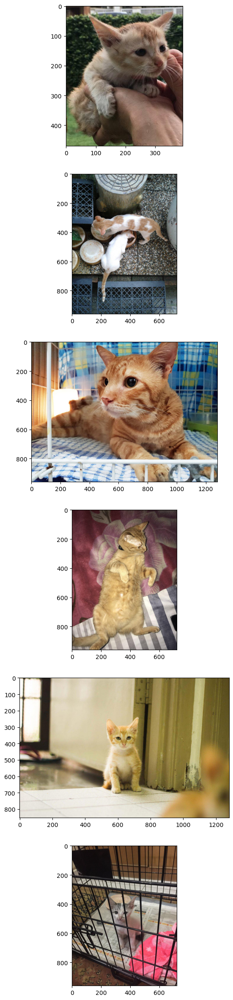

In [8]:
# origin image examples

fig = plt.figure(figsize=(10,30))
for i in range(6):
    plt.subplot(6,1,i+1)
    plt.imshow(imread(f'{image_dir}/{files[i]}'))
plt.show()

## 2. Resize (and rescale)

Our dataset contains images of different sizes, we need to transform them to one. There are different techniques to get it.
Firstly, we need to lead them to the same ratio (1:1 in this example).

### 2.1. Resize by random crop

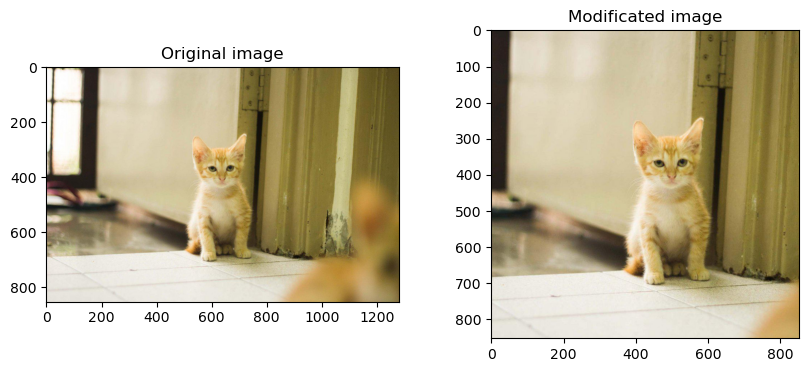

In [9]:
origin_image = imread(f'{image_dir}/{files[4]}')
modif_image = tf.image.stateless_random_crop(origin_image, 
                        size=(min(origin_image.shape[:2]), min(origin_image.shape[:2]), 3), seed=[0,0])
visualize(origin_image, modif_image)

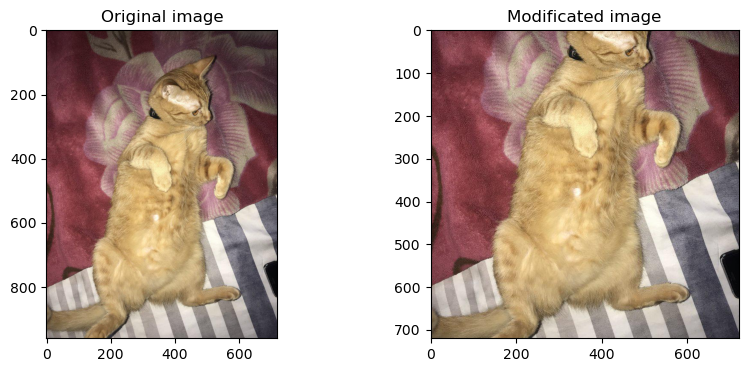

In [10]:
origin_image = imread(f'{image_dir}/{files[3]}')
modif_image = tf.image.stateless_random_crop(origin_image, 
                        size=(min(origin_image.shape[:2]), min(origin_image.shape[:2]), 3), seed=[0,0])
visualize(origin_image, modif_image)

### 2.2. Resize by central crop

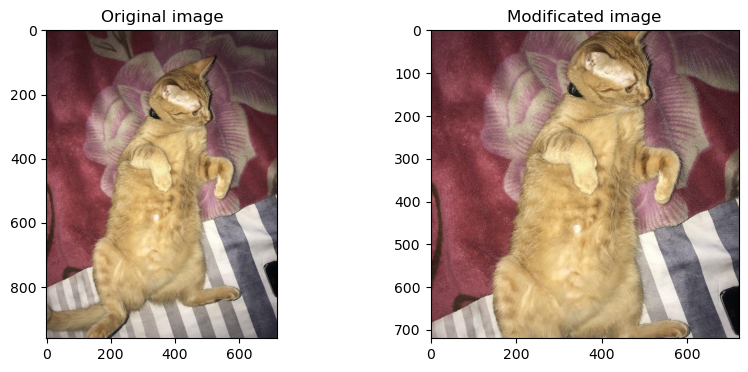

In [11]:
origin_image = imread(f'{image_dir}/{files[3]}')
modif_image = central_crop_min(origin_image)
visualize(origin_image, modif_image)

### 2.3. Resize with pad

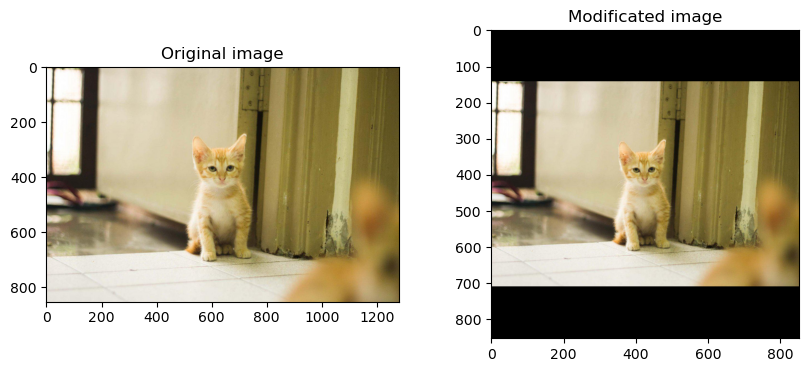

In [12]:
origin_image = imread(f'{image_dir}/{files[4]}')
modif_image = tf.image.resize_with_pad(origin_image, 
                                       min(origin_image.shape[:2]), min(origin_image.shape[:2]), 
                                                                      method='nearest', antialias=True)
visualize(origin_image, modif_image)

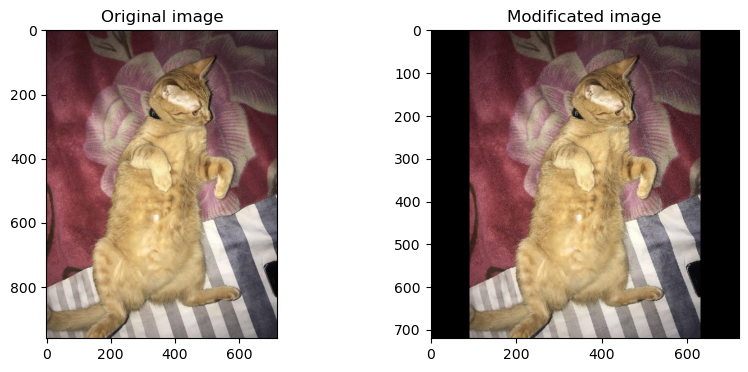

In [13]:
origin_image = imread(f'{image_dir}/{files[3]}')
modif_image = tf.image.resize_with_pad(origin_image, 
                                       min(origin_image.shape[:2]), min(origin_image.shape[:2]), 
                                                                      method='nearest', antialias=True)
visualize(origin_image, modif_image)

### 2.4. Resize without image ratio maintenance

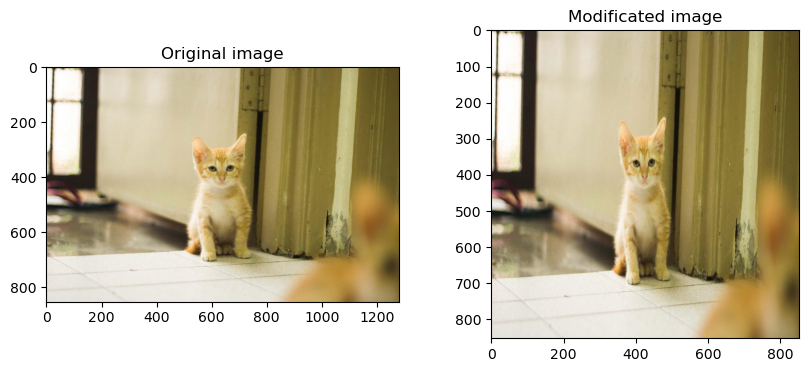

In [14]:
origin_image = imread(f'{image_dir}/{files[4]}')
modif_image = tf.image.resize(origin_image, size=(min(origin_image.shape[:2]), min(origin_image.shape[:2])), 
                              method='nearest', preserve_aspect_ratio=False, antialias=True)
visualize(origin_image, modif_image)

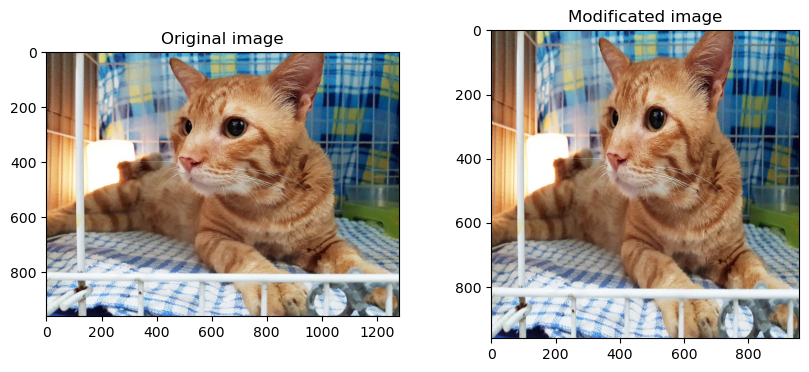

In [15]:
origin_image = imread(f'{image_dir}/{files[2]}')
modif_image = tf.image.resize(origin_image, size=(min(origin_image.shape[:2]), min(origin_image.shape[:2])), 
                              method='nearest', preserve_aspect_ratio=False, antialias=True)
visualize(origin_image, modif_image)

Let's use central crop by min size to lead our images to 1:1 image ratio and then resize them to 224x224 resolution. Also we add rescaling by dividing pixel values by 255.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


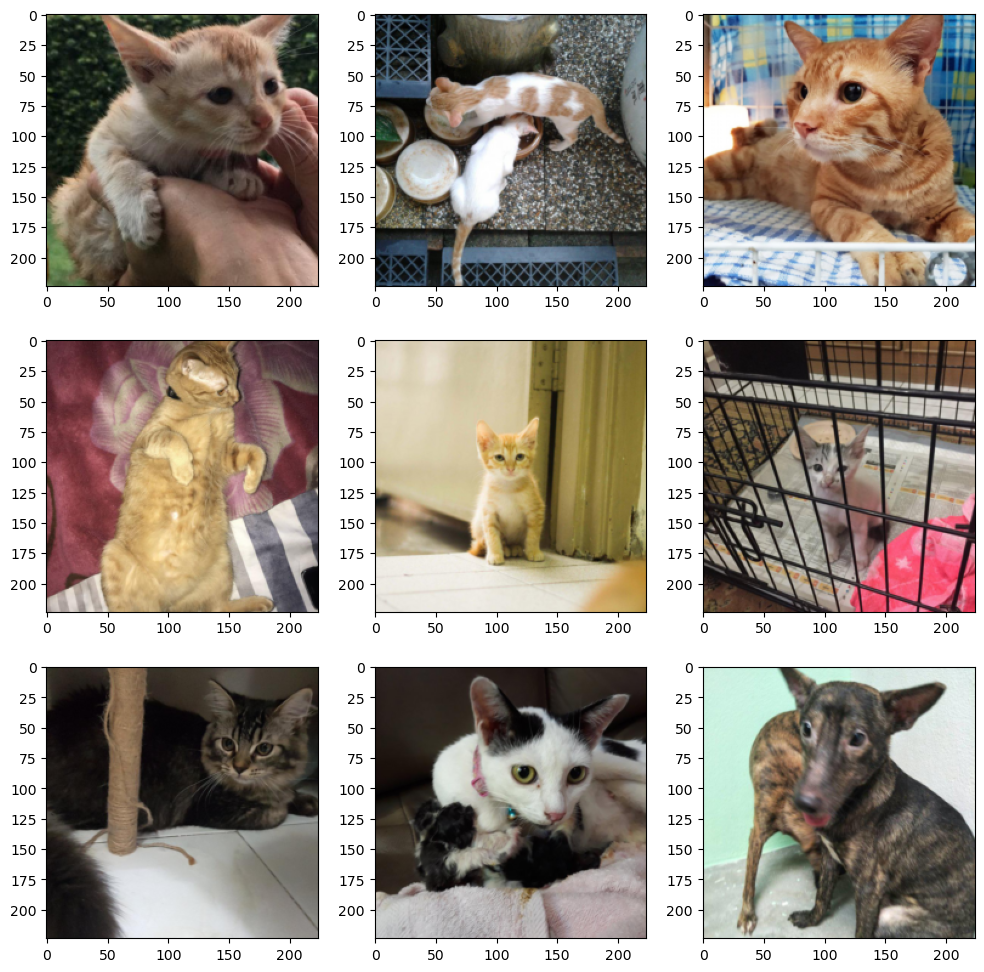

In [16]:
# preprocessing image examples

fig = plt.figure(figsize=(12,12))
for i in range(9):
    plt.subplot(3,3,i+1)
    plt.imshow(image_preprocessing(imread(f'{image_dir}/{files[i]}')))
plt.show()

This preprocessing will be enough to use images as input por model training if there is no any image augmentation.

## 3. Augmentation

### 3.1. cental crop

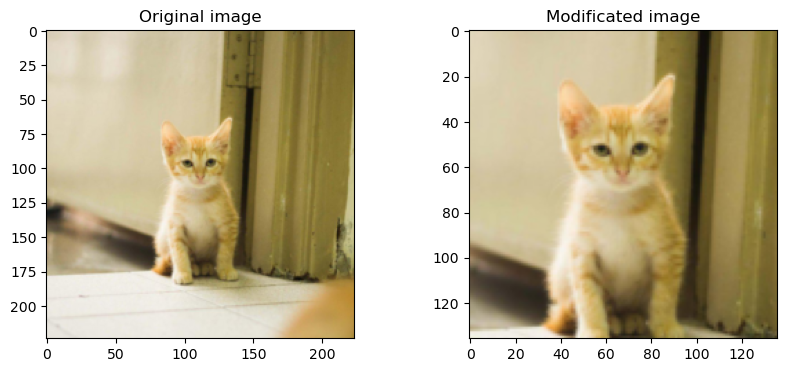

In [17]:
origin_image = image_preprocessing(imread(f'{image_dir}/{files[4]}'))
modif_image = tf.image.central_crop(origin_image, central_fraction=0.6)  # 0.6 from shape
visualize(origin_image, modif_image)

### 3.2. random crop

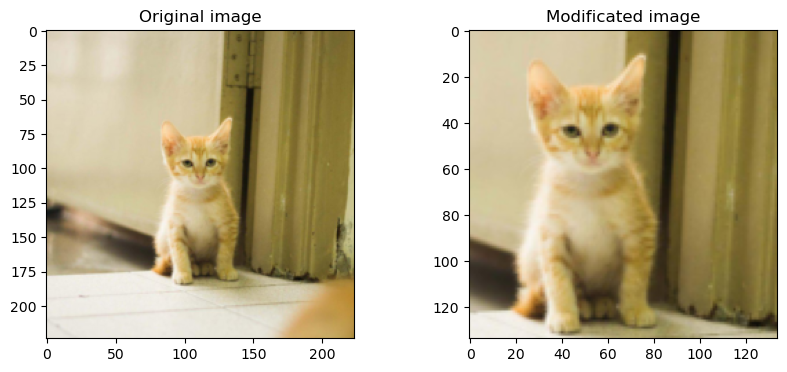

In [18]:
modif_image = tf.image.stateless_random_crop(origin_image, 
                        size=(int(0.6*input_size), int(0.6*input_size), 3), seed=[0,0])
visualize(origin_image, modif_image)

### 3.3. flip left right

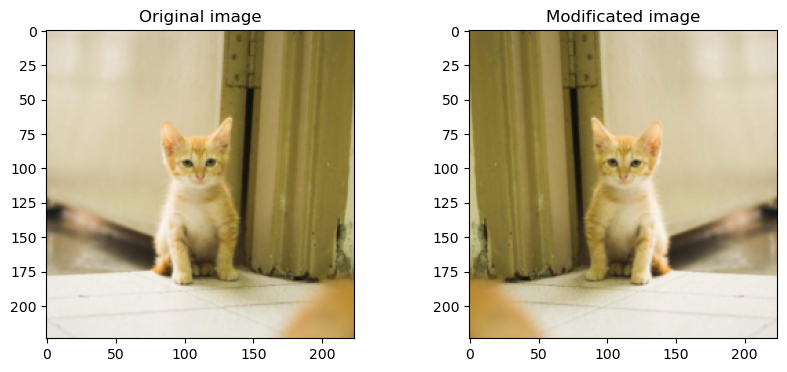

In [19]:
modif_image = tf.image.flip_left_right(origin_image)
visualize(origin_image, modif_image)

### 3.4. flip up down

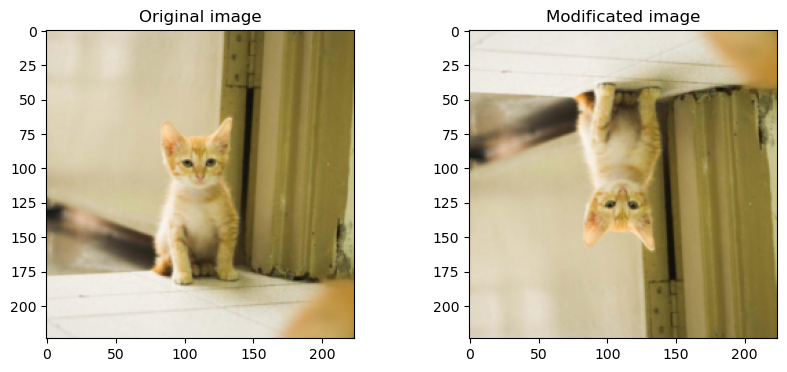

In [20]:
modif_image = tf.image.flip_up_down(origin_image)
visualize(origin_image, modif_image)

### 3.5. rotation 90º

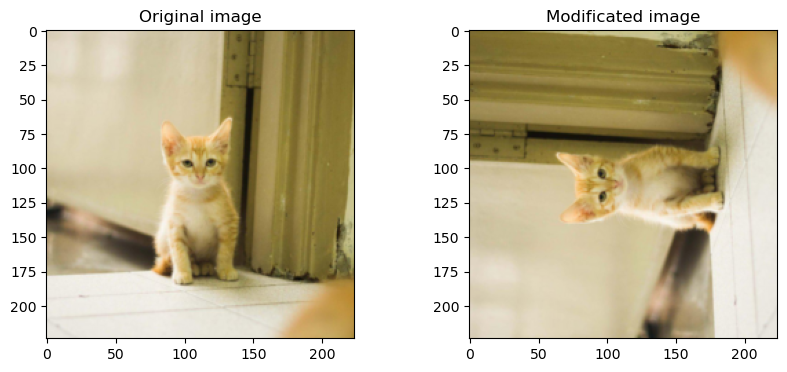

In [21]:
modif_image = tf.image.rot90(origin_image, k=1)
visualize(origin_image, modif_image)

### 3.6. random rotation

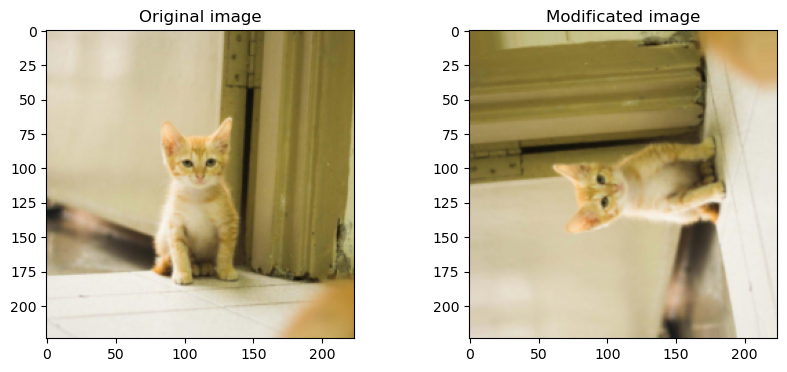

In [22]:
modif_image = keras_image.random_rotation(origin_image, rg=180, row_axis=0, col_axis=1, channel_axis=2)  
visualize(origin_image, modif_image)

### 3.7. adjust brightness
### delta = 0.2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


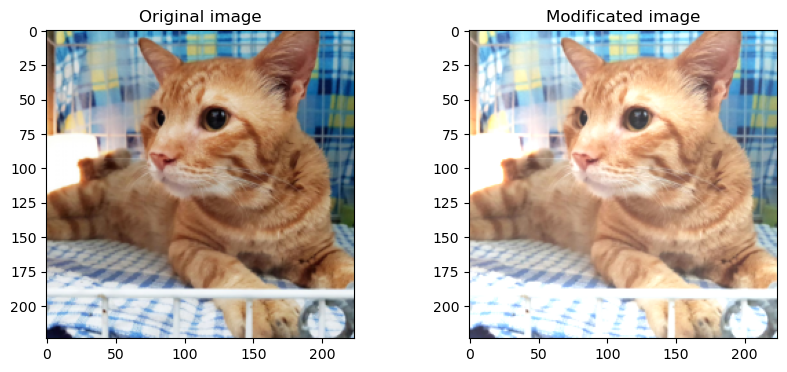

In [23]:
origin_image = image_preprocessing(imread(f'{image_dir}/{files[2]}'))
modif_image = tf.image.adjust_brightness(origin_image, delta=0.2)
visualize(origin_image, modif_image)

### delta = 0.4

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


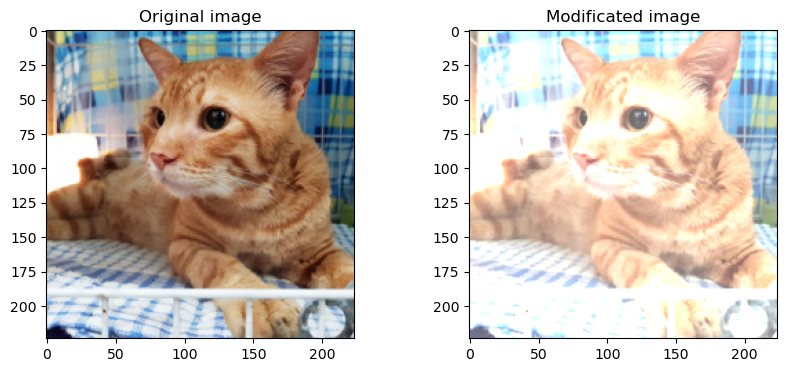

In [24]:
modif_image = tf.image.adjust_brightness(origin_image, delta=0.4)
visualize(origin_image, modif_image)

### random brightness

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


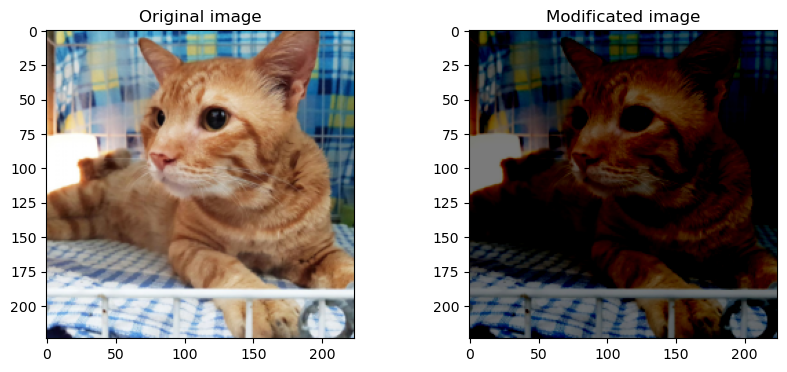

In [25]:
modif_image = tf.image.stateless_random_brightness(origin_image, max_delta=0.9, seed=[0,0])
visualize(origin_image, modif_image)

### 3.8. adjust_contrast
### contrast_factor = 2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


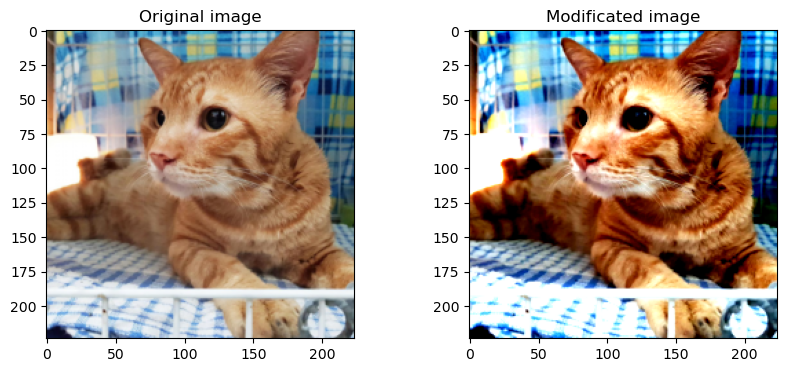

In [26]:
modif_image = tf.image.adjust_contrast(origin_image, contrast_factor=2)
visualize(origin_image, modif_image)

### contrast_factor = 0.5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


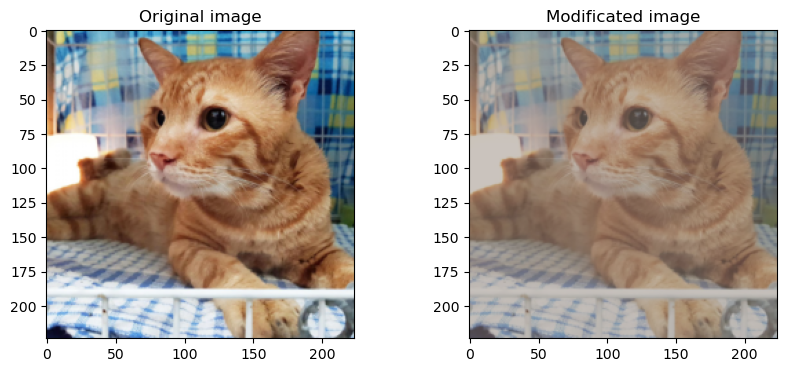

In [27]:
modif_image = tf.image.adjust_contrast(origin_image, contrast_factor=0.5)
visualize(origin_image, modif_image)

### random contrast

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


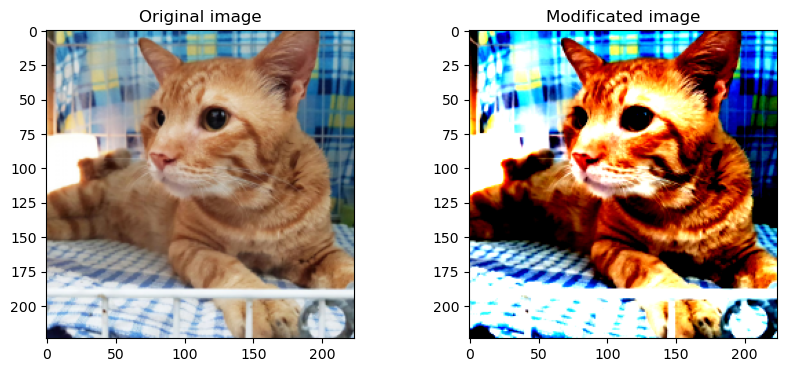

In [28]:
modif_image = tf.image.stateless_random_contrast(origin_image, lower=0.2, upper=4, seed=[1,0])
visualize(origin_image, modif_image)

### 3.9. adjust_hue
### delta = 0.2

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


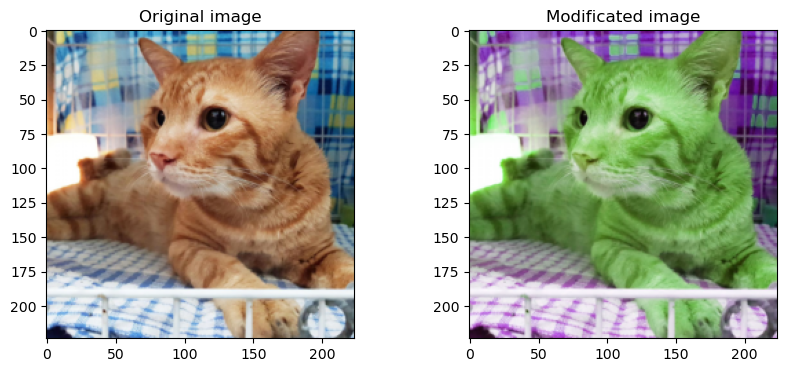

In [29]:
modif_image = tf.image.adjust_hue(origin_image.astype(np.float64), delta=0.2)
visualize(origin_image, modif_image)

### delta = 0.7

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


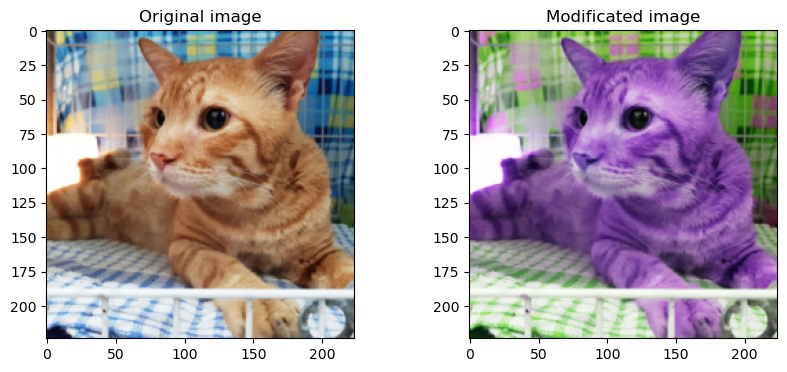

In [30]:
modif_image = tf.image.adjust_hue(origin_image, delta=0.7)
visualize(origin_image, modif_image)

### random hue

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


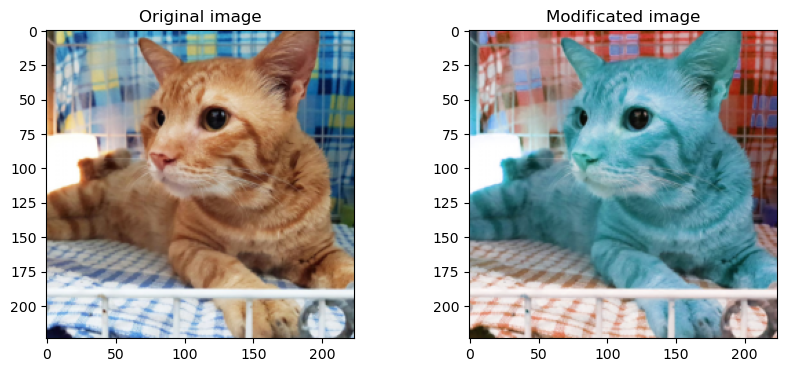

In [31]:
modif_image = tf.image.stateless_random_hue(origin_image, max_delta=0.5, seed=[2,2])
visualize(origin_image, modif_image)

### 3.10. adjust_saturation
### saturation_factor=0.25

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


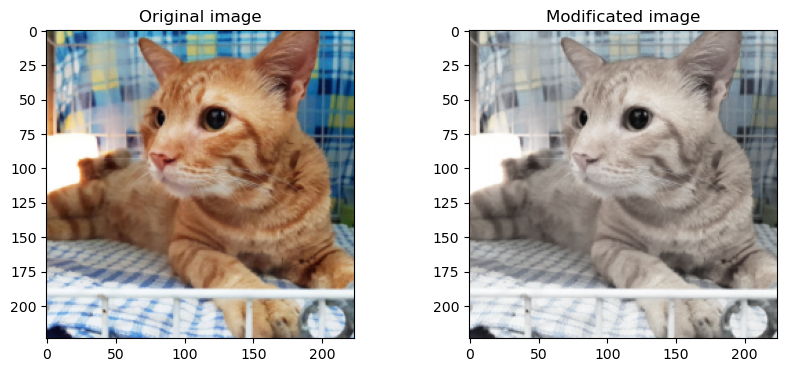

In [32]:
modif_image = tf.image.adjust_saturation(origin_image, saturation_factor=0.25)
visualize(origin_image, modif_image)

### saturation_factor=5

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


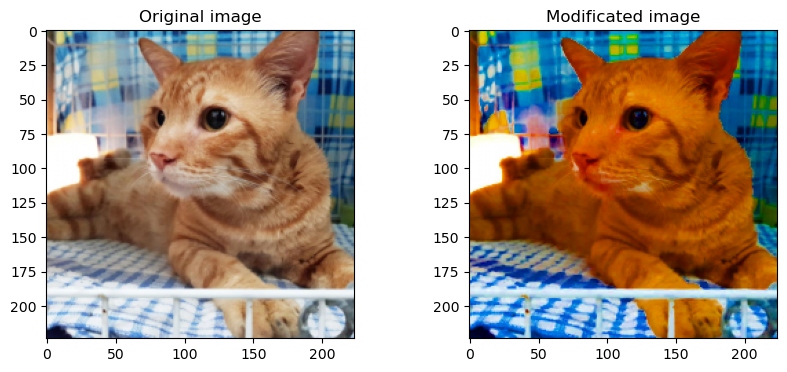

In [33]:
modif_image = tf.image.adjust_saturation(origin_image, saturation_factor=5)
visualize(origin_image, modif_image)

### random saturation

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


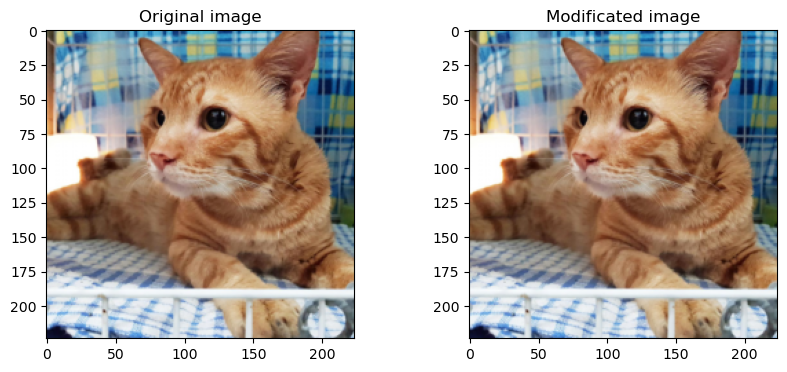

In [34]:
modif_image = tf.image.stateless_random_saturation(origin_image, lower=0.2, upper=4, seed=[0,0])
visualize(origin_image, modif_image)

## 4. Implementing ImageDataGenerator

In [35]:
data_gen_args = dict(#rescale=1./255,
                     featurewise_center=True,
                     featurewise_std_normalization=True,
                     rotation_range=90,
                     width_shift_range=0.1,
                     height_shift_range=0.1,
                     #brightness_range=(0.2,0.9),
                     zoom_range=0.2)

image_datagen = keras_image.ImageDataGenerator(**data_gen_args)

In [36]:
# Put some images to array
n = 10
images_array = np.empty((n, input_size, input_size, 3))

for i, file_name in enumerate(files[:n]):
    image = image_preprocessing(imread(f'{image_dir}/{file_name}'))
    images_array[i,:,:,:] = image

In [37]:
# Provide the same seed and keyword arguments to the fit and flow methods

seed = 1
image_datagen.fit(images_array, augment=True, seed=seed)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


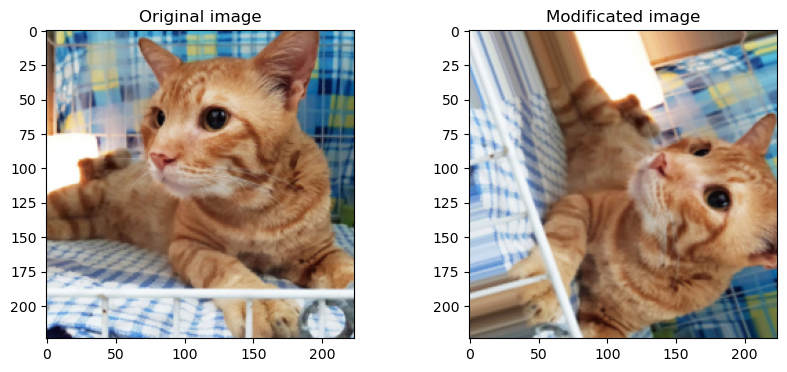

In [38]:
modif_image = image_datagen.random_transform(origin_image) 
visualize(origin_image, modif_image)

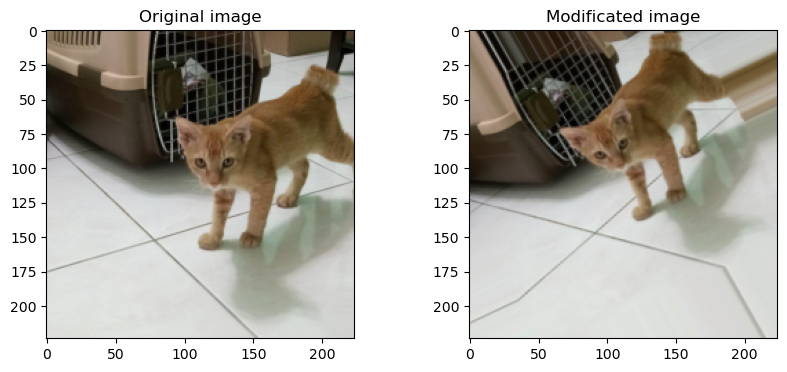

In [39]:
origin_image = image_preprocessing(imread(f'{image_dir}/{files[11]}'))
modif_image = image_datagen.random_transform(origin_image) 
visualize(origin_image, modif_image)